In [2]:
import logging

import numpy as np
import cv2
import skimage

import scipy.ndimage as ndi
import matplotlib.pyplot as plt

from skimage.segmentation import clear_border
from skimage.color import rgb2gray, gray2rgb

from utils.loader import FactoryLoader
from utils.preprocessing import *
from utils.utils import *

In [3]:
DS_PATH = r"C:\Users\gimes\Src\repos\CADx-Project\dataset\binary\train"

In [4]:
if torch.cuda.is_available():
    print("CUDA is available")
    print("Devices:")
    [print(torch.cuda.get_device_name(i)) for i in range(torch.cuda.device_count())]
    print("___")
else:
    print("CUDA is not available")

CUDA is available
Devices:
NVIDIA GeForce RTX 4050 Laptop GPU
___


_____

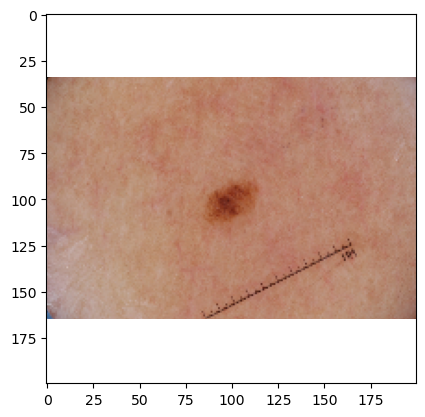

In [5]:
factory = PreprocessingFactory()
factory.normalize2float()
factory.pad2square(np.nan)
factory.resize((200,200))
#factory.gaussian_smoothing()

loader = FactoryLoader(DS_PATH, factory=factory, batch_size=12, percentage=5, shuffle=False)

# loader.get_size()
# loader.show_images()
im, lab = loader.get_element_by_id(5)
plt.imshow(im)

In [6]:
class OtsuTh(PreprocessingStep):
    def __init__(self, morph_op=cv2.MORPH_DILATE, kernel_size=5, remove_border=True):
        self.morph_op = morph_op
        self.kernel_size = kernel_size
        self.remove_border = remove_border
    
    def apply(self, image: np.ndarray) -> np.ndarray:
        # Convert to gray
        gray = (rgb2gray(image)*255).astype(np.uint8)

        # Apply otsu-thresholding
        _, otsu_threshold = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
        otsu_threshold = otsu_threshold.astype(bool)   
        
        # Bin. morphological operation for conservation
        se =  cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (self.kernel_size,self.kernel_size))
        otsu_threshold = cv2.morphologyEx(otsu_threshold.astype(float), self.morph_op, se)
        otsu_threshold = otsu_threshold.astype(bool)
        
        # Clear border in case of black rim
        if self.remove_border:
            otsu_threshold = skimage.segmentation.clear_border(otsu_threshold)

        # Apply mask on each channel
        masked = np.dstack([
            (image[:,:,0] * otsu_threshold).astype(np.uint8),
            (image[:,:,1] * otsu_threshold).astype(np.uint8),
            (image[:,:,2] * otsu_threshold).astype(np.uint8)])
 
        return masked

    def get_step_params(self):
        return {"name": "otsu",
                "correction_type": str(self.morph_op),
                "kernel_size": self.kernel_size,
                "remove_border": self.remove_border}

In [10]:
class CropROI(PreprocessingStep):
    def __init__(self, black_threshold_ratio=0.05):
        self.black_threshold_ratio = black_threshold_ratio  # Threshold for black pixel ratio

    def apply(self, image: np.ndarray) -> np.ndarray:
        """
        Crops the region of interest (ROI) by removing large black areas around the image,
        but only if the black pixel ratio exceeds the threshold.
        """
        # Convert image to grayscale for thresholding
        gray = norm(rgb2gray(image), np.uint8)

        # Check for black pixel regions (assume black pixels have value close to 0)
        black_pixels = np.sum(gray == 0)
        total_pixels = gray.size
        black_pixel_ratio = black_pixels / total_pixels

        # Check if black pixels exceed the threshold
        if black_pixel_ratio > self.black_threshold_ratio:
            #print(f"Black pixel ratio {black_pixel_ratio:.2f} exceeds threshold. Applying cropping.")

            # Apply a binary threshold to find regions that are not black
            _, binary_mask = cv2.threshold(gray, 10, 255, cv2.THRESH_BINARY)

            # Find contours on the binary mask
            contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            if contours:
                # Find the largest contour (assumed to be the region of interest)
                largest_contour = max(contours, key=cv2.contourArea)

                # Get the bounding box for the largest contour
                x, y, w, h = cv2.boundingRect(largest_contour)

                # Crop the image to this bounding box
                cropped_image = image[y:y+h, x:x+w]
                return cropped_image
            else:
                #print("No significant region of interest found. Returning the original image.")
                return image
        else:
            #print(f"Black pixel ratio {black_pixel_ratio:.2f} is below threshold. No cropping applied.")
            return image

    def get_step_params(self):
        return {"name": "crop_roi", "black_threshold_ratio": self.black_threshold_ratio}
  

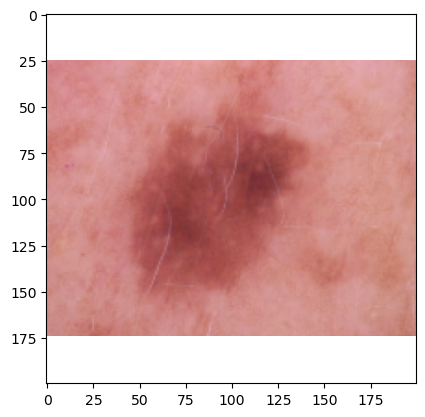

In [12]:
factory = PreprocessingFactory()
factory.gaussian_smoothing(5)
# factory.add_preprocessing_step(OtsuTh())

factory.normalize2float()
factory.add_preprocessing_step(CropROI())
factory.add_preprocessing_step(Pad2Square(np.nan))
factory.resize((200,200))

loader = FactoryLoader(DS_PATH, factory=factory, batch_size=12, percentage=5, shuffle=True)

im, lab = loader.get_element_by_id(88)
plt.imshow(im)
plt.show()

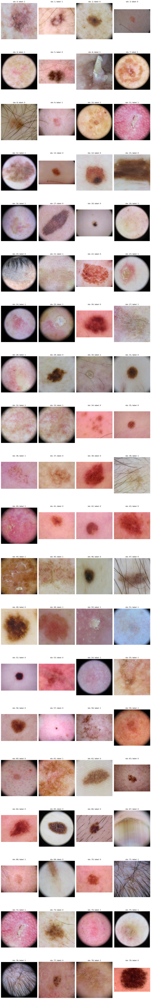

In [13]:
loader.show_images(80)